# Dasymetric Mapping Workshop

* Dasymetric mapping is a geospatial interpolation technique
* It distributes data within a spatial geography based on assumptions
* Often paired with population data because people don’t often live in the water or in the undeveloped forest.

>Dasymetric mapping is a geospatial technique that uses information such as land cover types to more accurately distribute data that have been assigned to selected boundaries like census blocks. ([EPA](https://www.epa.gov/enviroatlas/dasymetric-toolbox#:~:text=Dasymetric%20mapping%20is%20a%20geospatial,solely%20on%20the%20census%20data.))

This process will follow binary dasymetric interpolation as shown here: https://pysal.org/tobler/notebooks/binary_dasymetric.html.

In [92]:
# Setup
import geopandas as gpd
import pandas as pd
import osmnx as ox
import numpy as np
import matplotlib.pyplot as plt

from tobler.area_weighted import area_interpolate
from tobler.dasymetric import extract_raster_features

## Read in demographic data and filter to Lynn 
Read in demographic tract data. 
Filter just to Lynn tracts so we can focus on them in the workshop.

In [96]:
demo = gpd.read_file('data/base/ForDasyWorkshop.gpkg', 
                     layer = 'Demo2021')
demo = demo.to_crs(26986)

lynn_tract_GEOIDS = ['25009207100', '25009205900', '25009206100', '25009206300',
                     '25009205800', '25009206600', '25009206800','25009206500',
                     '25009205200', '25009206000', '25009205700','25009205300',
                     '25009206900', '25009207000', '25009205500','25009206200',
                     '25009205500', '25009206200', '25009206400','25009205400',
                     '25009206700', '25009207200', '25009205100','25009205600' ]
demo_lynn = demo[demo.GEOID.isin(lynn_tract_GEOIDS)]
demo_lynn.explore(tiles = "Stamen Toner Lite", column = 'percent_lowinc') # 'minority_pct'

In [14]:
# Static plots work too (quicker to check)
# demo.plot()
# demo_lynn.plot()

## Read in output geography 
Read in Conveyal grid (converted to vector geometry in [Existing Ineqtuities](https://github.com/CTPSSTAFF/existing-inequities/blob/main/analysis/Process_Conveyal.R)):

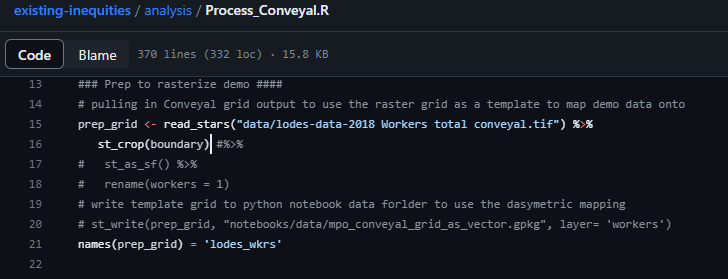

In [62]:
conveyal_grid = gpd.read_file('data/base/mpo_conveyal_grid_as_vector.gpkg', layer= 'workers')
conveyal_grid = conveyal_grid.to_crs(26986)
conveyal_grid.insert(0, 'id', range(1, 1+len(conveyal_grid)))
# Here we just want to focus on Lynn
conveyal_grid_lynn = conveyal_grid.sjoin(demo_lynn, how= 'inner')
conveyal_grid_lynn = conveyal_grid_lynn.drop_duplicates(subset=['id'])

In [101]:
m = demo_lynn.explore(color = 'green', name = "tracts", tiles = "Stamen Toner Lite")
m = conveyal_grid_lynn.explore(m=m, name = "grid")

m

## Pull roads from OSM and prep
For a given place (Lynn): 
* pull the OSM drive network and pull the primary roads 
* save the network outputs and read in as spatial layers of streets and primary streets 
* remove the primary streets from the streets layer
* project and buffer the streets

In [40]:
place = 'Lynn, Massachusetts'
drive_net = ox.graph_from_place(place, network_type='drive')
drive_net_primary = ox.graph_from_place('Massachusetts', 
                                        network_type='drive', 
                                        custom_filter='["highway"~"motorway|motorway_link|primary"]')

# OSMNX pull the network data from open street map.
# The network consists of edges and nodes
# In this step we reaally only want the geographic shape of the streets, so saving as a geopackage
ox.save_graph_geopackage(drive_net, "data/processed/drive_network.gpkg")
ox.save_graph_geopackage(drive_net_primary, "data/processed/MA_drive_primary.gpkg")

# then we can read the spatial data and use geopandas operations with it
streets = gpd.read_file("data/processed/drive_network.gpkg",layer = 'edges')
primary_streets = gpd.read_file("data/processed/MA_drive_primary.gpkg", layer = 'edges')

In [64]:
primary_ids = primary_streets.osmid.unique()
streets_res = streets[~streets.osmid.isin(primary_ids)]

###### project and buffer streets by 300 ft (91.44 meters)
streets_res = streets_res.to_crs(26986)
streets_res_buf = streets_res.buffer(91.44)

In [65]:
print('all streets in Lynn (n):', streets['osmid'].nunique())
print('street in Lynn without primary streets (n):', streets_res['osmid'].nunique())

all streets in Lynn (n): 1597
street in Lynn without primary streets (n): 1582


In [74]:
# You can plot the network graph (edges and nodes)
#ox.plot_graph(drive_net)

In [102]:
m = streets_res_buf.explore(m=m, color = 'white', name = 'streets_buffered')
m = streets_res.explore(m=m , name = 'streets')
m

## Prep land cover data from NLCD
2019 landcover downloaded from: full landcover (https://www.mrlc.gov/data/nlcd-2019-land-cover-conus) and impervious surfaces (https://www.mrlc.gov/data/nlcd-2019-developed-imperviousness-descriptor-conus), download: https://www.mrlc.gov/data?f%5B0%5D=year%3A2019

This step pulls in landcover with at least 5% impevious surface within the 30 meter square grid cell that overlaps with a buffered street.

For the workshop, I clipped the impervious surface raster to the area around Lynn and put that output in the data folder.

In [69]:
nlcd_path = 'data/base/nlcd_2019_impervious_l48_20210604_clippedAroundLynn.tif'

In [99]:
dev_lynn = extract_raster_features(streets_res_buf, nlcd_path,  pixel_values=list(range(5,101)), collapse_values=True)
dev_lynn = dev_lynn.to_crs(26986)

dev_lynn.explore(tiles = "Stamen Toner Lite")

## Intersection between developed areas and demographic data

In [72]:
dasy = gpd.clip(demo_lynn, dev_lynn)

In [100]:
dasy.explore(tiles = "Stamen Toner Lite")

## Interpolate
Clipping the spatial geometry only changes the geographic shape, it does not change any of the values associated with the shapes.
'If a census tract had 2000 people in it and covered 1 sqmi, but only a quarter mile of the tract was urbanized, the new geodataframe effectively shows these 2000 people occupying the quarter mile.' 
To fix that, we interpolate based on area.  This step still assumes that population density is constant across our new geometries, but because the new geometry only covers 'developed area' it is more plausible than assuming constant population density across the original census geometry.

In [81]:
#dasy.columns
#demo_lynn.head()
demo_cols = ['pop_dec', 'minority_pop', 'nonminority_pop','lowinc', 'nonlowinc', 'youth', 'elderly', 'LEP', 'disability']

dasy[demo_cols] = dasy[demo_cols].fillna(0)
interp = area_interpolate(dasy, conveyal_grid_lynn, extensive_variables=demo_cols)

In [91]:
interp.explore(column = 'pop_dec', tiles = "Stamen Toner Lite")

## Check sums

In [103]:
print( 'pop_dec Lynn:', demo_lynn['pop_dec'].sum()) 
print( 'pop_dec interpolated:' , interp['pop_dec'].sum())

pop_dec Lynn: 101253.0
pop_dec interpolated: 101253.00141534953


## Save data

In [104]:
demo_lynn.to_file('data/processed/dasymetric-process.gpkg', layer = 'demo_lynn')
streets_res_buf.to_file('data/processed/dasymetric-process.gpkg', layer = 'streets_res_buf')
dev_lynn.to_file('data/processed/dasymetric-process.gpkg', layer = 'dev_lynn')
dasy.to_file('data/processed/dasymetric-process.gpkg', layer = 'dasy')
interp.to_file('data/processed/dasymetric-process.gpkg', layer = 'interpolated_output')